# Similarity Matrix Visualization

I try to visualize the similarity of datapoints in a matrix format. If there appears to be discernible features between target labels or the character feature, we should be able to observe low values within a class and high values elsewhere. Low values using similarity-based metrics indicate high similarity.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean, pdist, squareform, cosine

TRAINSET = '../data/raw/0173eeb640e7-Challenge+Data+Set+-+Campus+Analytics+2020.xlsx'

In [2]:
# Load in data and visually inspect/verify
df = pd.read_excel(TRAINSET)
df

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X22,X23,X24,X25,X26,X27,X28,X29,XC,y
0,0.985703,0.899527,2.332283,1.044273,1.141718,-1.656647,-1.409265,1.043518,-0.931461,-1.726754,...,0.628801,0.511403,0.562767,-0.356514,0.867604,-0.218642,-0.336591,0.096781,C,0
1,0.539816,0.243602,1.636048,-0.562150,-0.235560,-1.316039,1.529069,-1.415871,-1.167266,-0.103195,...,0.734907,0.929244,-0.805046,0.268788,1.025799,1.112271,1.492585,-0.497020,E,0
2,-1.424483,-0.470533,0.095100,0.131981,1.168902,-0.827530,-1.233111,0.556679,-1.384065,-1.197944,...,-1.398526,-2.139636,-1.238090,-0.139802,-2.317249,0.113483,0.521594,1.269208,E,0
3,-1.034157,-1.054496,0.339467,-0.829151,0.012123,0.048887,0.573195,-0.189184,-0.674289,0.975835,...,0.305298,-0.368107,-0.664859,0.225715,-0.865773,-0.026332,-0.209023,0.074814,E,0
4,0.177091,1.154216,1.004133,-0.724015,-0.508090,-0.478284,-0.524431,1.841560,-1.147140,0.435025,...,1.095991,-0.993104,-0.775456,0.938553,0.662388,0.483111,-0.910481,1.544431,E,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,0.127214,-0.644439,-0.356251,-1.188522,0.646979,-1.018895,-0.153524,-0.102938,1.109257,0.173160,...,-1.362069,-2.267345,0.329806,0.255234,-1.145799,0.673261,-0.072575,0.233888,A,1
2996,0.427700,1.460896,-1.260326,2.206359,-0.981929,0.045186,0.406928,-0.409999,0.602068,-1.145479,...,0.558446,-1.430444,0.067506,-0.865400,0.571944,1.172911,-0.917354,0.126003,C,0
2997,-0.880540,0.678472,0.493897,-0.118869,0.005285,-0.201233,-0.601732,-0.747260,-0.413440,-1.144848,...,0.924523,-0.304820,0.153800,0.316073,0.243841,-1.641217,0.287025,0.591607,B,1
2998,0.151291,-0.949928,-1.960683,-1.352557,2.221015,-0.775556,0.932388,-0.963642,0.649496,-1.658190,...,0.896517,-0.586427,-0.314806,-0.048052,0.142921,1.057203,-1.335579,-0.108947,B,0


In [3]:
label_counts = df['y'].value_counts()
label_counts

0    2069
1     931
Name: y, dtype: int64

In [4]:
# Sort then create dataframe with only the first 30 features
df = df.sort_values('y')
df

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X22,X23,X24,X25,X26,X27,X28,X29,XC,y
0,0.985703,0.899527,2.332283,1.044273,1.141718,-1.656647,-1.409265,1.043518,-0.931461,-1.726754,...,0.628801,0.511403,0.562767,-0.356514,0.867604,-0.218642,-0.336591,0.096781,C,0
1793,-0.716102,-0.261634,-0.323025,-1.651662,-0.260885,-1.957791,0.323752,0.096683,-1.768730,0.410831,...,0.010077,1.340180,-0.371864,-1.129174,-1.355492,1.886612,0.152491,1.471918,C,0
1794,0.305138,0.459066,-0.294612,-0.242762,0.161037,2.073740,-0.444656,0.168953,0.615100,-0.482753,...,-0.022956,-0.565035,0.188878,-0.210513,0.043736,0.100726,0.466431,-0.792506,E,0
1795,1.385708,-0.028144,-0.165358,0.691800,-1.509129,0.597521,1.304786,-0.392586,1.550288,-0.585395,...,0.808490,0.369640,1.847466,-0.163090,0.775759,0.944105,-0.263703,-1.237902,B,0
1797,0.986939,0.962095,-1.042369,1.248102,1.139195,1.017939,1.185458,2.007686,0.783888,-1.241755,...,-0.321044,0.294251,-0.670251,0.328491,-0.100648,-0.115616,-0.582188,0.152984,C,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2248,-0.587327,1.229948,0.220168,-1.475470,-0.910405,0.094462,-1.540684,0.352425,-1.072678,-0.638979,...,0.791813,1.133378,-2.361829,-0.798682,-0.763670,0.138407,-0.545227,-1.068655,A,1
1587,1.954128,0.758674,-1.155364,0.028767,-0.179407,0.838225,-1.270389,-0.576886,-2.159942,-0.325633,...,-1.957896,1.308925,-0.575242,-1.142984,0.869828,0.828191,-0.286371,-2.569096,C,1
2250,1.018272,1.581626,-0.555887,-0.333828,0.482023,2.284912,1.112169,-2.480259,-0.516256,1.447147,...,0.345919,-1.935466,-0.411201,-0.222759,-1.294217,0.363090,0.222258,1.040771,B,1
2253,-0.985093,0.449419,0.018759,1.264722,-1.200750,0.206570,0.790738,0.277791,1.582753,-0.222881,...,-1.898330,0.411617,0.199244,-1.015997,-1.398522,-0.704493,-0.365748,0.948219,D,1


The first 2069 indices of the similarity matrix will have target labels 0. The following 931 indices will have target labels 1.

The target labels and the char feature column 'XC' is dropped so that we are left with the numerical features of each data point.

### Features

In [5]:
# All features ('X1', 'X2', 'X3', ..., 'X29', 'XC')
# Char feature column 'XC' converted to numerical index for similarity metrics purposes
feat_df = df.drop(['y'], axis=1)
feat_df.XC = feat_df.XC.astype('category').cat.codes
feat_df

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X21,X22,X23,X24,X25,X26,X27,X28,X29,XC
0,0.985703,0.899527,2.332283,1.044273,1.141718,-1.656647,-1.409265,1.043518,-0.931461,-1.726754,...,0.217853,0.628801,0.511403,0.562767,-0.356514,0.867604,-0.218642,-0.336591,0.096781,2
1793,-0.716102,-0.261634,-0.323025,-1.651662,-0.260885,-1.957791,0.323752,0.096683,-1.768730,0.410831,...,0.218072,0.010077,1.340180,-0.371864,-1.129174,-1.355492,1.886612,0.152491,1.471918,2
1794,0.305138,0.459066,-0.294612,-0.242762,0.161037,2.073740,-0.444656,0.168953,0.615100,-0.482753,...,1.631985,-0.022956,-0.565035,0.188878,-0.210513,0.043736,0.100726,0.466431,-0.792506,4
1795,1.385708,-0.028144,-0.165358,0.691800,-1.509129,0.597521,1.304786,-0.392586,1.550288,-0.585395,...,0.314137,0.808490,0.369640,1.847466,-0.163090,0.775759,0.944105,-0.263703,-1.237902,1
1797,0.986939,0.962095,-1.042369,1.248102,1.139195,1.017939,1.185458,2.007686,0.783888,-1.241755,...,0.756742,-0.321044,0.294251,-0.670251,0.328491,-0.100648,-0.115616,-0.582188,0.152984,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2248,-0.587327,1.229948,0.220168,-1.475470,-0.910405,0.094462,-1.540684,0.352425,-1.072678,-0.638979,...,0.207994,0.791813,1.133378,-2.361829,-0.798682,-0.763670,0.138407,-0.545227,-1.068655,0
1587,1.954128,0.758674,-1.155364,0.028767,-0.179407,0.838225,-1.270389,-0.576886,-2.159942,-0.325633,...,-1.441372,-1.957896,1.308925,-0.575242,-1.142984,0.869828,0.828191,-0.286371,-2.569096,2
2250,1.018272,1.581626,-0.555887,-0.333828,0.482023,2.284912,1.112169,-2.480259,-0.516256,1.447147,...,-0.877910,0.345919,-1.935466,-0.411201,-0.222759,-1.294217,0.363090,0.222258,1.040771,1
2253,-0.985093,0.449419,0.018759,1.264722,-1.200750,0.206570,0.790738,0.277791,1.582753,-0.222881,...,0.907505,-1.898330,0.411617,0.199244,-1.015997,-1.398522,-0.704493,-0.365748,0.948219,3


In [6]:
# Without char feature column 'XC'
# Numerical features only
feat_df_no_xc = df.drop(['y', 'XC'], axis=1)
feat_df_no_xc

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29
0,0.985703,0.899527,2.332283,1.044273,1.141718,-1.656647,-1.409265,1.043518,-0.931461,-1.726754,...,1.385378,0.217853,0.628801,0.511403,0.562767,-0.356514,0.867604,-0.218642,-0.336591,0.096781
1793,-0.716102,-0.261634,-0.323025,-1.651662,-0.260885,-1.957791,0.323752,0.096683,-1.768730,0.410831,...,1.477941,0.218072,0.010077,1.340180,-0.371864,-1.129174,-1.355492,1.886612,0.152491,1.471918
1794,0.305138,0.459066,-0.294612,-0.242762,0.161037,2.073740,-0.444656,0.168953,0.615100,-0.482753,...,-1.333766,1.631985,-0.022956,-0.565035,0.188878,-0.210513,0.043736,0.100726,0.466431,-0.792506
1795,1.385708,-0.028144,-0.165358,0.691800,-1.509129,0.597521,1.304786,-0.392586,1.550288,-0.585395,...,0.521905,0.314137,0.808490,0.369640,1.847466,-0.163090,0.775759,0.944105,-0.263703,-1.237902
1797,0.986939,0.962095,-1.042369,1.248102,1.139195,1.017939,1.185458,2.007686,0.783888,-1.241755,...,0.808184,0.756742,-0.321044,0.294251,-0.670251,0.328491,-0.100648,-0.115616,-0.582188,0.152984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2248,-0.587327,1.229948,0.220168,-1.475470,-0.910405,0.094462,-1.540684,0.352425,-1.072678,-0.638979,...,-1.099679,0.207994,0.791813,1.133378,-2.361829,-0.798682,-0.763670,0.138407,-0.545227,-1.068655
1587,1.954128,0.758674,-1.155364,0.028767,-0.179407,0.838225,-1.270389,-0.576886,-2.159942,-0.325633,...,1.415342,-1.441372,-1.957896,1.308925,-0.575242,-1.142984,0.869828,0.828191,-0.286371,-2.569096
2250,1.018272,1.581626,-0.555887,-0.333828,0.482023,2.284912,1.112169,-2.480259,-0.516256,1.447147,...,-0.184053,-0.877910,0.345919,-1.935466,-0.411201,-0.222759,-1.294217,0.363090,0.222258,1.040771
2253,-0.985093,0.449419,0.018759,1.264722,-1.200750,0.206570,0.790738,0.277791,1.582753,-0.222881,...,0.365789,0.907505,-1.898330,0.411617,0.199244,-1.015997,-1.398522,-0.704493,-0.365748,0.948219


In [7]:
# Dataframe sorted by char feature 'XC'
df_sort_xc = feat_df.sort_values('XC')

# Numerical features only
feat_df_sort_xc = df_sort_xc.drop(['XC'], axis=1)

df_sort_xc.head()

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X21,X22,X23,X24,X25,X26,X27,X28,X29,XC
2999,1.351919,-0.353120,-0.918519,-0.417465,-0.688730,-0.157284,-1.233306,-0.199669,-1.000622,-0.676667,...,1.025231,-0.084711,1.105593,-1.728433,1.575538,-1.092105,0.863792,0.551103,-1.432635,0
2924,-0.406918,0.979250,0.067850,2.651669,-1.443495,-1.241899,-0.473691,-0.614935,-0.057018,-0.000859,...,0.090110,-1.824792,1.753797,0.353054,1.107711,1.094762,1.125057,0.171259,-1.337130,0
10,0.462387,-0.934142,-0.339431,0.275421,-0.397764,-0.974711,-1.322740,-0.528149,0.268872,1.041599,...,-1.459608,-0.884684,-1.164550,0.615164,1.511350,0.738271,0.554492,-0.219664,-0.920442,0
2928,-0.050352,0.686271,0.468999,-1.759381,-1.470897,1.206268,-0.123726,1.031052,0.579646,-1.272184,...,0.870123,1.140697,-0.490887,1.482503,-0.327954,-0.356106,1.740773,0.911990,0.040573,0
2929,0.134581,0.091384,-1.206851,0.260104,-0.168237,0.244342,0.226016,0.536975,0.443390,0.372280,...,2.132664,-0.899601,2.451393,1.987662,0.966732,0.221715,0.230437,0.087020,1.476179,0


In [8]:
feat_df_sort_xc.head()

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29
2999,1.351919,-0.353120,-0.918519,-0.417465,-0.688730,-0.157284,-1.233306,-0.199669,-1.000622,-0.676667,...,0.218222,1.025231,-0.084711,1.105593,-1.728433,1.575538,-1.092105,0.863792,0.551103,-1.432635
2924,-0.406918,0.979250,0.067850,2.651669,-1.443495,-1.241899,-0.473691,-0.614935,-0.057018,-0.000859,...,0.097671,0.090110,-1.824792,1.753797,0.353054,1.107711,1.094762,1.125057,0.171259,-1.337130
10,0.462387,-0.934142,-0.339431,0.275421,-0.397764,-0.974711,-1.322740,-0.528149,0.268872,1.041599,...,-0.400408,-1.459608,-0.884684,-1.164550,0.615164,1.511350,0.738271,0.554492,-0.219664,-0.920442
2928,-0.050352,0.686271,0.468999,-1.759381,-1.470897,1.206268,-0.123726,1.031052,0.579646,-1.272184,...,0.003707,0.870123,1.140697,-0.490887,1.482503,-0.327954,-0.356106,1.740773,0.911990,0.040573
2929,0.134581,0.091384,-1.206851,0.260104,-0.168237,0.244342,0.226016,0.536975,0.443390,0.372280,...,0.302012,2.132664,-0.899601,2.451393,1.987662,0.966732,0.221715,0.230437,0.087020,1.476179


# Discovering Similarities by Target Label

For each similarity metric measured, the dataframe that includes the char feature column 'XC' and excludes it are represented in their own matrices.

### Representative Example

If the features of the data points are distinctive, the similarity resemble something of the following example below.

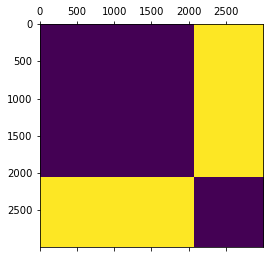

In [9]:
idx = 0
example = np.ones((sum(label_counts), sum(label_counts)))
for i in label_counts:
    example[idx: idx + i, idx: idx + i] = 0
    idx += i

plt.figure()
plt.matshow(example, fignum=1)
plt.show()

In [10]:
def euclidean_based_similarity(u, v):
    return 1 - (1. / (1 + euclidean(u, v)))

def cosine_similarity(u, v):
    return cosine(u, v)

def visualize(feat_df, sim_func):
    dists = pdist(feat_df, sim_func)
    sim_df = pd.DataFrame(squareform(dists), columns=feat_df.index, index=feat_df.index)
    plt.figure(figsize=(16,16))
    plt.matshow(sim_df, fignum=1)
    plt.show()

### Euclidean based similarity

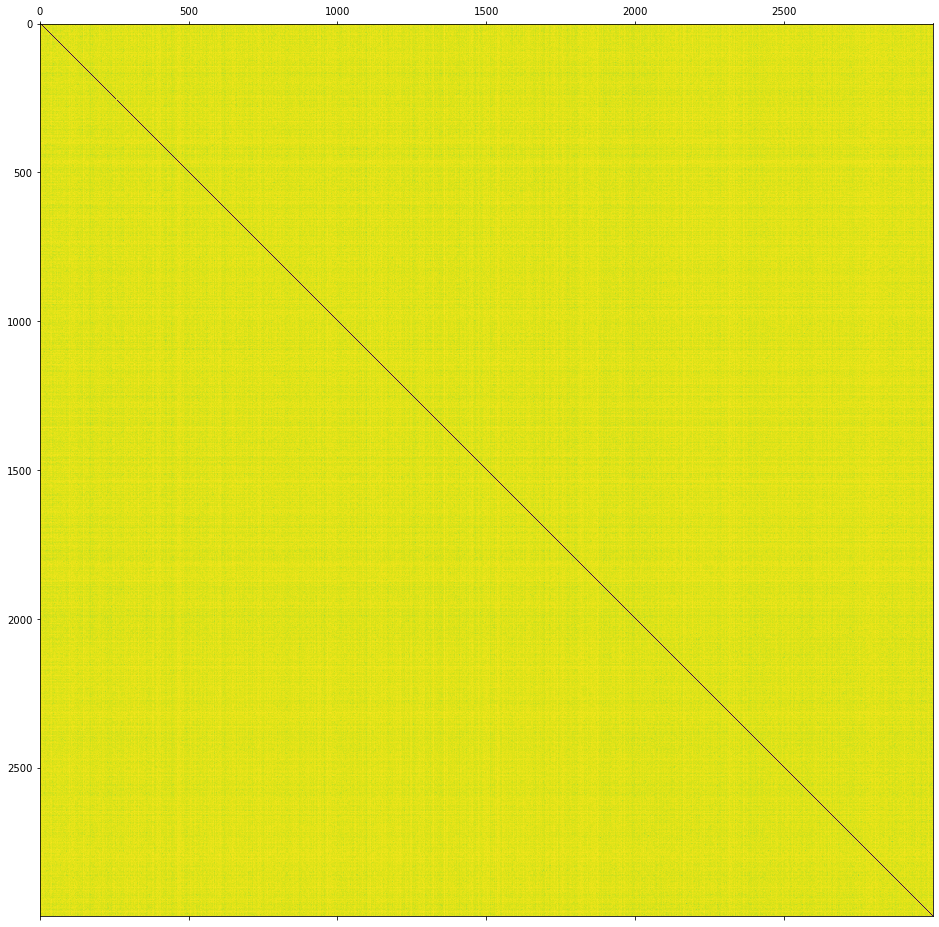

In [11]:
visualize(feat_df, euclidean_based_similarity)

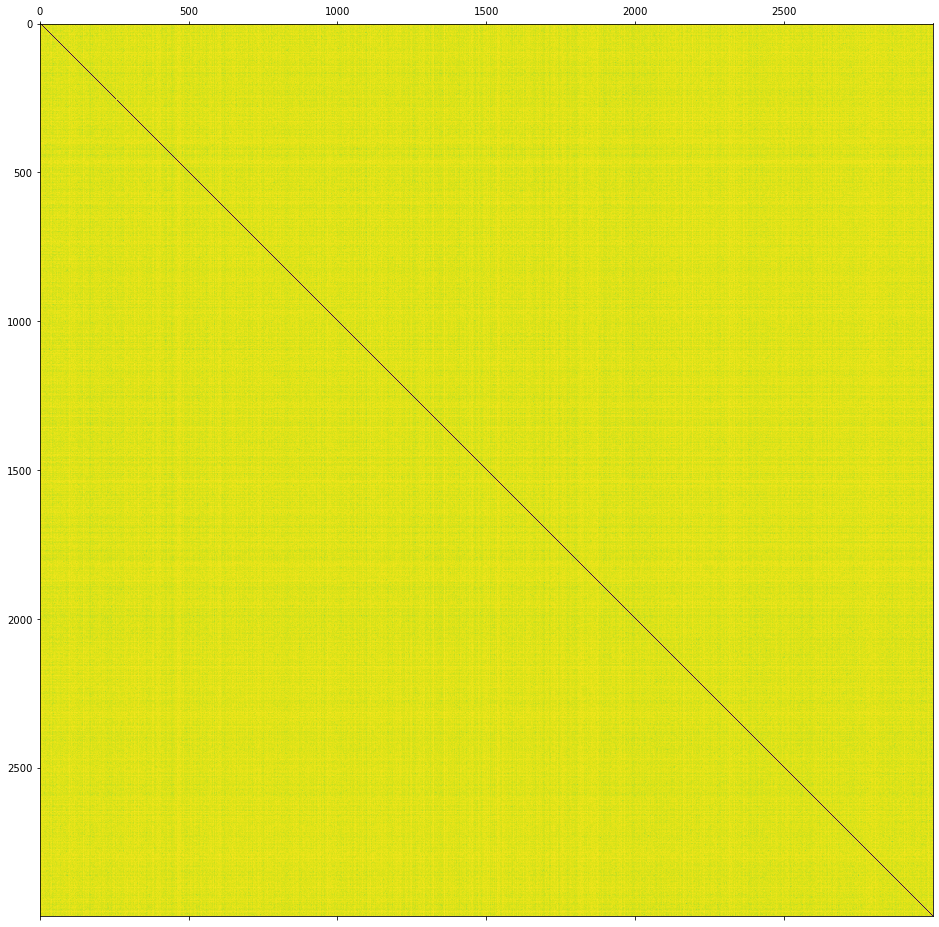

In [12]:
visualize(feat_df_no_xc, euclidean_based_similarity)

Results appear uniform across target labels, more specifically, it's indicating that the euclidean distance between a point and every other point is very very large. This metric fails to provide evidence of distinctive features across classes.

### Cosine Similarity

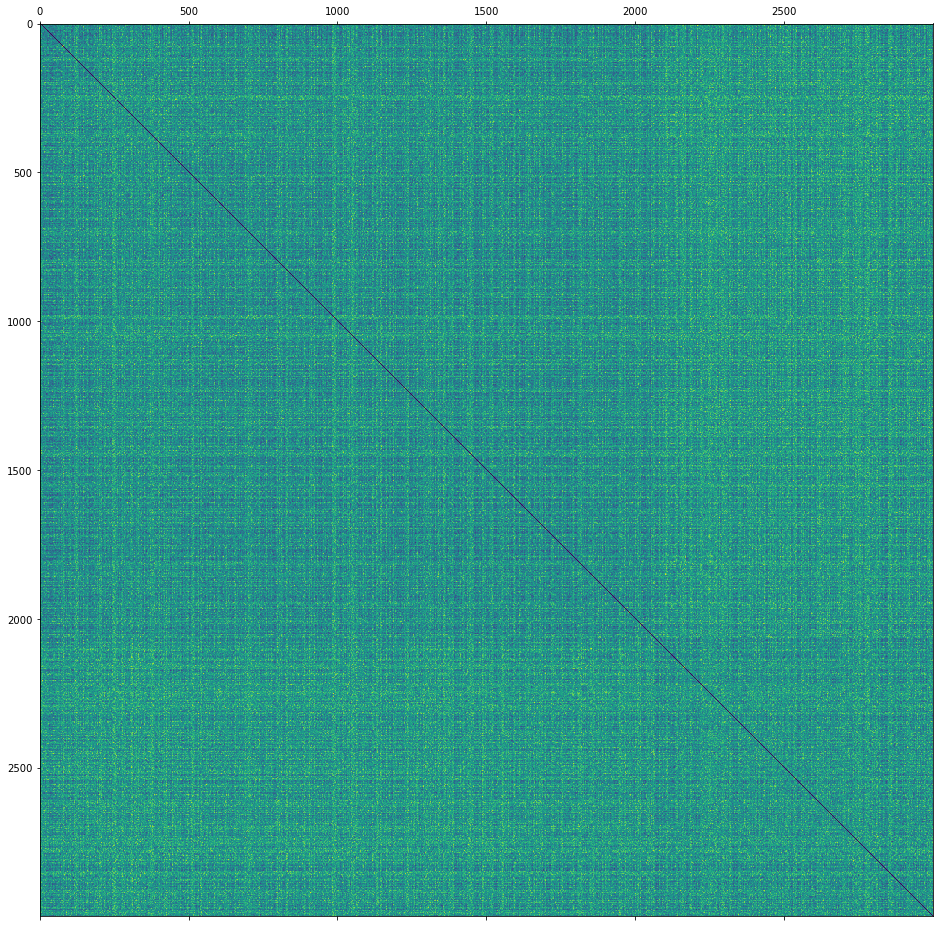

In [13]:
visualize(feat_df, cosine_similarity)

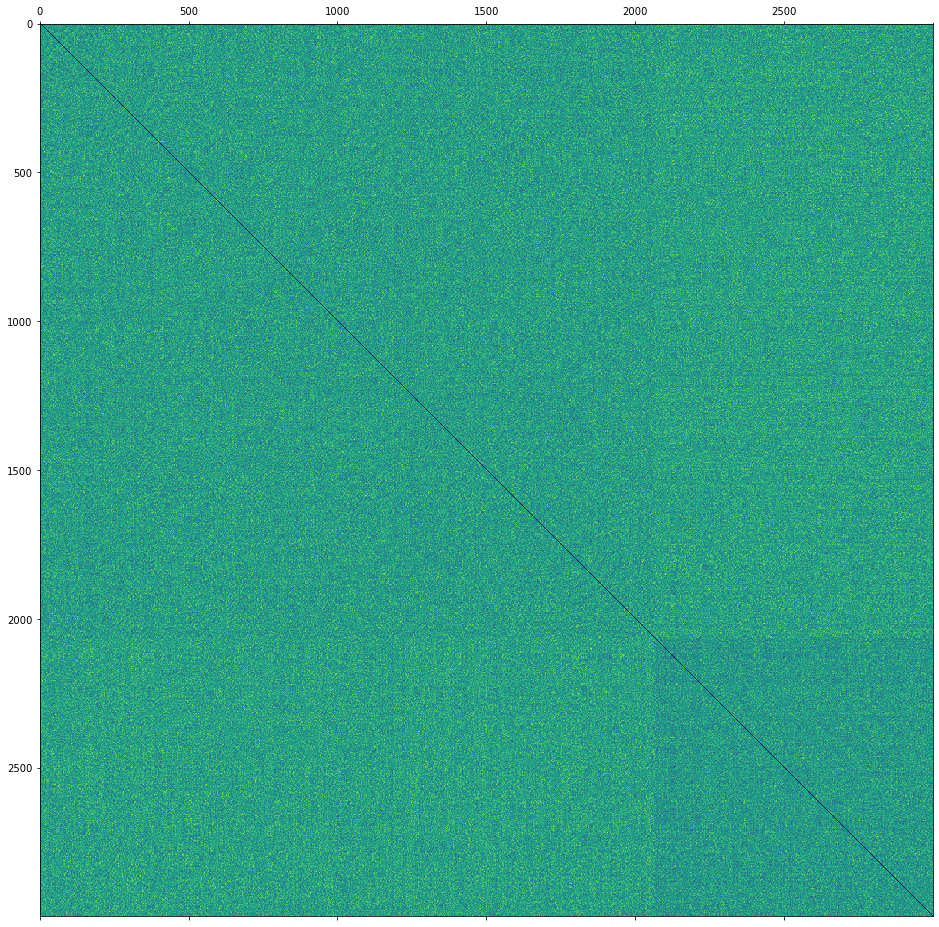

In [14]:
visualize(feat_df_no_xc, cosine_similarity)

These consine similarity matrices show, very faintly, evidence of distinctive features between target labels. 
The graph where the char feature column 'XC' was excluded shows a more prominent divide between the binary classes.

Irrespective of the magnitudes of the features, there does appear to be similarities in datapoints within a target label.

# Discovering Similarities by Char Feature 'XC'
Although the classification task does not use the char feature column 'XC' as a class, I attempt to see if the char feature 'XC' is strongly correlated with the numerical features. If so, then this feature will also be correlated with the final binary classification label.

In [15]:
xc_counts = df['XC'].value_counts().sort_index()
xc_counts

A    615
B    552
C    665
D    580
E    588
Name: XC, dtype: int64

### Representative Example

If the features of the data points are distinctive, the similarity resemble something of the following example below.

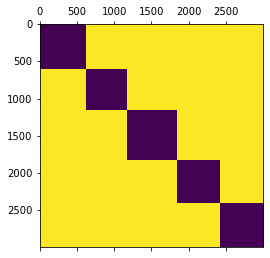

In [16]:
idx = 0
example = np.ones((sum(xc_counts), sum(xc_counts)))
for i in xc_counts:
    example[idx: idx + i, idx: idx + i] = 0
    idx += i

plt.figure()
plt.matshow(example, fignum=1)
plt.show()

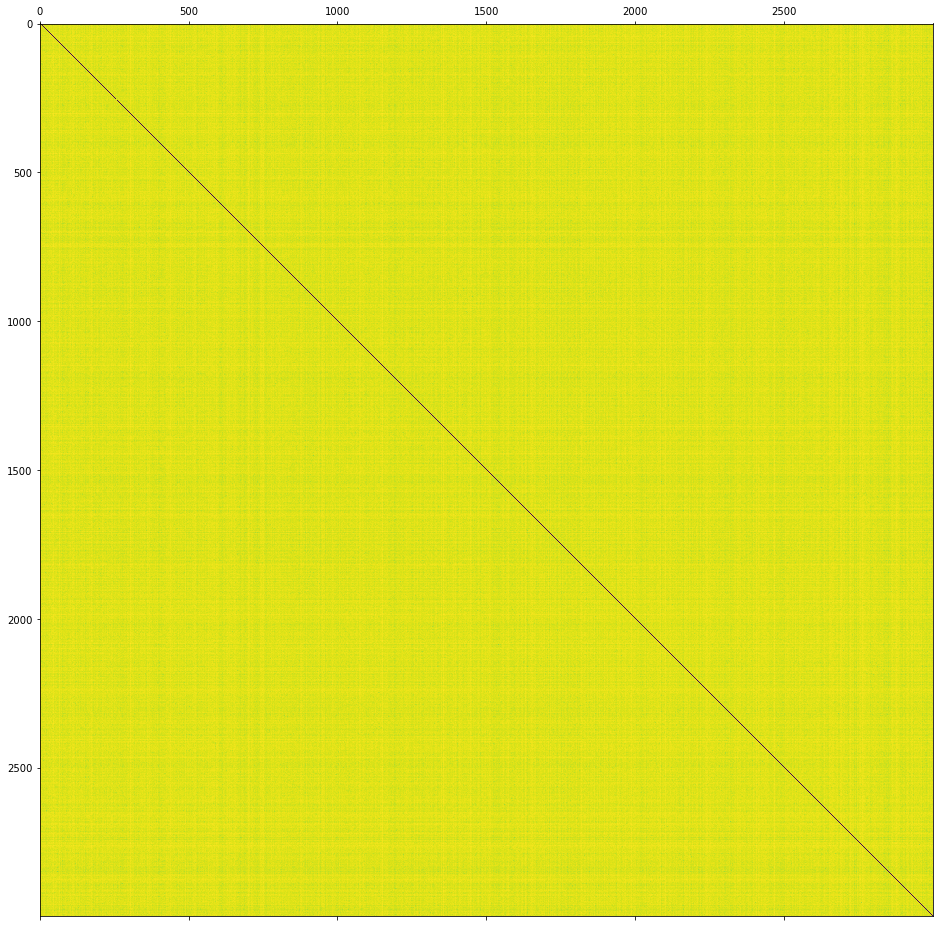

In [17]:
visualize(feat_df_sort_xc, euclidean_based_similarity)

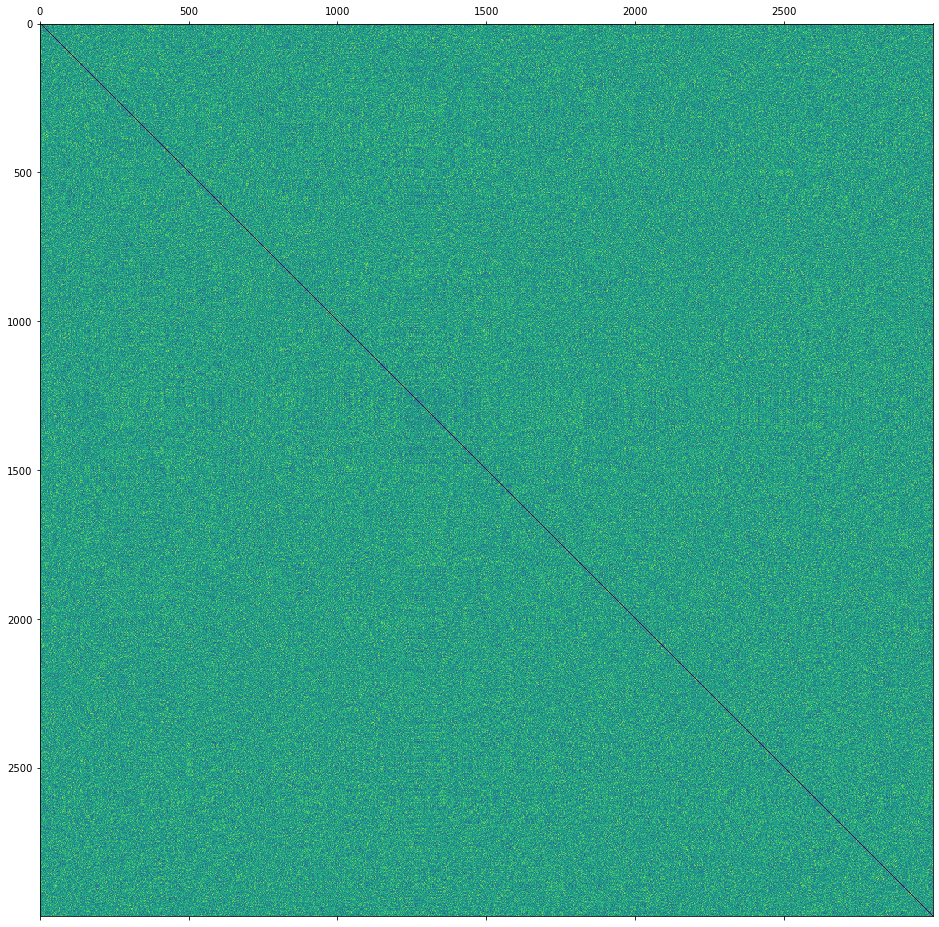

In [18]:
visualize(feat_df_sort_xc, cosine_similarity)

In both graphs, the chosen similarity metrics do not show any distinctive features between datapoints with different char feature 'XC' values.